# VAE

We want to model $p(x)$.

Assuming some latent factors, $p(x) = \int p(x | z) p(z) dz$. However, $p(x | z)$ is a neural network, so this integral has no closed form and is therefore intractable.

What if we had the posterior $p(z | x)$ to tell us which are the most important $z$ in this integral? Then instead of having to integrate over infinitely many $z$, we could sample from the most important ones. $p(x) = \int p(x, z) dz = \int p(z | x) \frac{p(x, z)}{p(z | x)} dz = \mathbb{E}_{z \sim p(z | x)} \left[ \frac{p(x, z)}{p(z | x)} \right]$. This looks very promising. For every data point $x$, we can just sample $z$ from the posterior, and compute $\frac{p(x, z)}{p(z | x)}$. The posterior $p(z | x)$ is our guide in latent space, showing us the most probable $z$ so we don't have to go to every $z$, just sample and correct for the sampling bias.

Can we compute $p(z | x)$? $p(z | x) = \frac{p(x, z)}{p(x)}$, so no, the denominator is the value we wanted to find in the first place.

We approximate $p(z | x) \approx q_\phi(z | x)$. So, $p(x) = \int p(x, z) dz = \int q_\phi(z | x) \frac{p(x, z)}{q_\phi(z | x)} dz = \mathbb{E}_{z \sim q_\phi(z | x)} \left[ \frac{p(x, z)}{q_\phi(z | x)} \right]$.

Taking logs: $\log p(x) = \log \mathbb{E}_{z \sim q_\phi(z | x)} \left[ \frac{p(x, z)}{q_\phi(z | x)} \right]$.

By Jensen's Inequality (log is concave): $\log \mathbb{E}_{z \sim q_\phi(z | x)} \left[ \frac{p(x, z)}{q_\phi(z | x)} \right] \ge \mathbb{E}_{z \sim q_\phi(z | x)} \left[ \log \frac{p(x, z)}{q_\phi(z | x)} \right]$

So $\log p(x) \ge \mathbb{E}_{z \sim q_\phi(z | x)} \left[ \log \frac{p(x, z)}{q_\phi(z | x)} \right]$ (RHS is ELBO).

$\mathbb{E}_{z \sim q_\phi(z | x)} \left[ \log \frac{p(x, z)}{q_\phi(z | x)} \right] = \mathbb{E}_{z \sim q_\phi(z | x)} \log p(x | z) + \mathbb{E}_{z \sim q_\phi(z | x)} \log \frac{p(z)}{q_\phi(z | x)} = \mathbb{E}_{z \sim q_\phi(z | x)} \log p(x | z) - \text{KL} \left[ q_\phi(z | x) || p(z) \right]$

Maximize $\log p(x) \ge \mathbb{E}_{z \sim q_\phi(z | x)} \log p_\theta(x | z) - \text{KL} \left[ q_\phi(z | x) || p(z) \right]$. The term on the left encourages good reconstructions from latent codes. The KL regularization term penalizes the posterior from deviating too far away from the latent prior.

So minimize $L = -\mathbb{E}_{z \sim q_\phi(z | x)} \log p_\theta(x | z) + \text{KL} \left[ q_\phi(z | x) || p(z) \right]$.

We have to sample $z \sim q_\phi(z | x)$. Using the Reparameterization Trick: $z \sim q_\phi(z | x) = N(\mu_\phi(x), \sigma_\phi^2(x) I)$, sample $z = \mu_\phi(x) + \sigma_\phi(x) \odot \epsilon, \epsilon \sim N(0, I)$

Assuming $p_\theta(x | z) = N(\mu_\theta(z), I)$: $\log p_\theta(x | z) \approx -\frac{1}{2} ||x - \mu_\theta(z)||^2$

Assuming $p(z) = N(0, I)$: $\text{KL} \left[ q_\phi(z | x) || p(z) \right] = \text{KL} \left[ N(\mu_\phi(x), \sigma_\phi^2(x) I) || N(0, I) \right] = \frac{1}{2} \sum_i \left[ \mu_{\phi, i}^2(x) + \sigma_{\phi, i}^2(x) -\log \sigma_{\phi, i}^2(x) - 1\right]$

tensor(-1.) tensor(1.)
torch.Size([60000, 1, 28, 28])


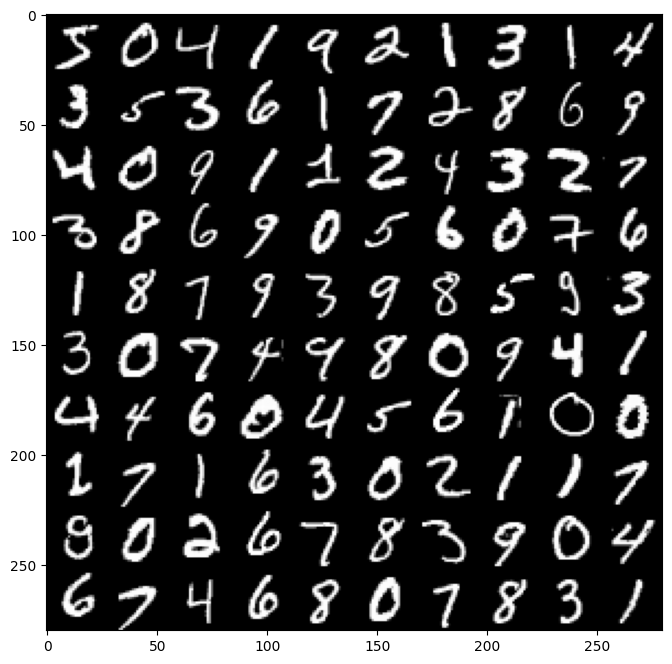

In [116]:
import torch
import matplotlib.pyplot as plt
from torchvision.datasets import MNIST
from einops import rearrange

ds = MNIST(root="data", train=True, download=True)
images, labels = ds.data, ds.targets

images = images.to(dtype=torch.float32)
images = (images - images.min()) / (images.max() - images.min())
images = (images * 2) - 1

print(images.min(), images.max())
images = images.unsqueeze(-3)
print(images.shape)

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(rearrange(images[:100], "(n b) c h w -> (n h) (b c w)", n=10), cmap="grey");
plt.show()

In [117]:
from torch import nn

class VAE(nn.Module):
    def __init__(self, latent_dim: int, hidden_dim: int):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Linear(784, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU()
        )
        self.mean_head = nn.Linear(hidden_dim, latent_dim)
        self.log_var_head = nn.Linear(hidden_dim, latent_dim)

        self.dec = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 784)
         )

    def forward(self, x: torch.Tensor):
        x = rearrange(x, "b c h w -> b (c h w)")
        int_z = self.enc(x)
        means = self.mean_head(int_z)
        log_vars = self.log_var_head(int_z)

        stds = (0.5 * log_vars).exp()
        zs = means + stds * torch.randn_like(means)

        x_recon = self.dec(zs)
        x_recon = rearrange(x_recon, "b (c h w) -> b c h w", c=1, h=28, w=28)
        return x_recon, means, log_vars, stds

     0: loss=369.6826   recon_loss=369.6759   kl=0.0669
  1000: loss=59.6319   recon_loss=56.9879   kl=26.4401
  2000: loss=50.5259   recon_loss=47.8421   kl=26.8383
  3000: loss=44.8000   recon_loss=42.1098   kl=26.9019
  4000: loss=42.0902   recon_loss=39.4765   kl=26.1370
  5000: loss=42.6484   recon_loss=39.9968   kl=26.5159
  6000: loss=44.4669   recon_loss=41.7755   kl=26.9136
  7000: loss=41.9054   recon_loss=39.2905   kl=26.1490
  8000: loss=40.1254   recon_loss=37.4407   kl=26.8475
  9000: loss=39.0739   recon_loss=36.4026   kl=26.7130
 10000: loss=37.1053   recon_loss=34.3800   kl=27.2526


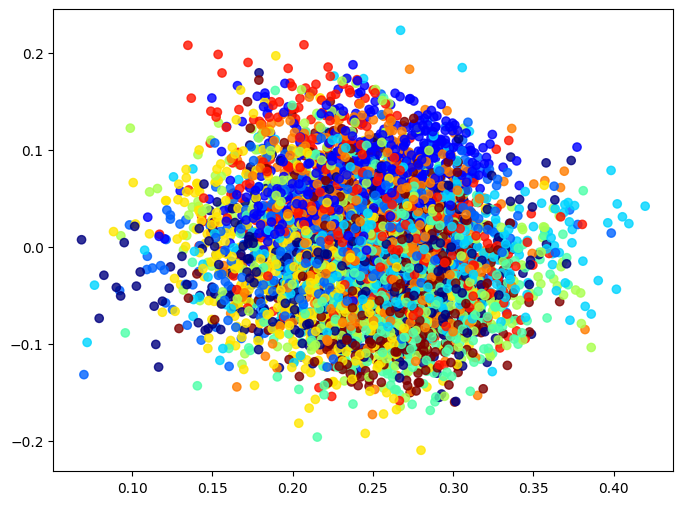

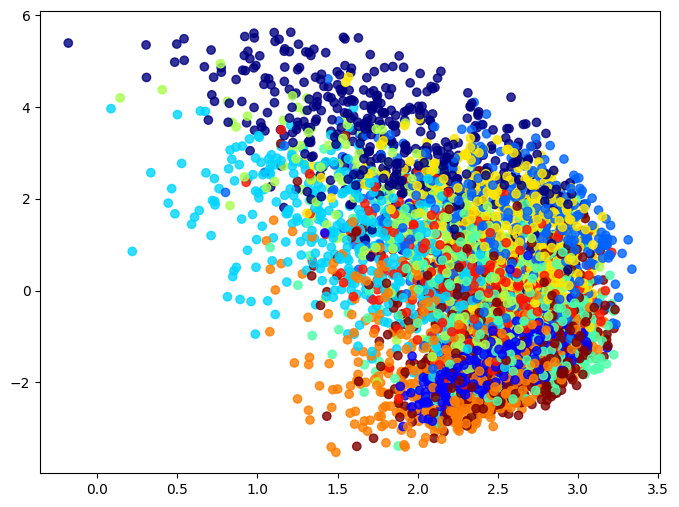

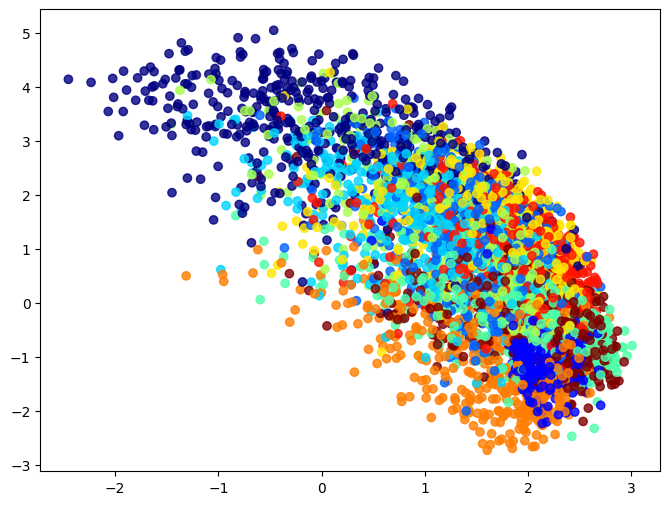

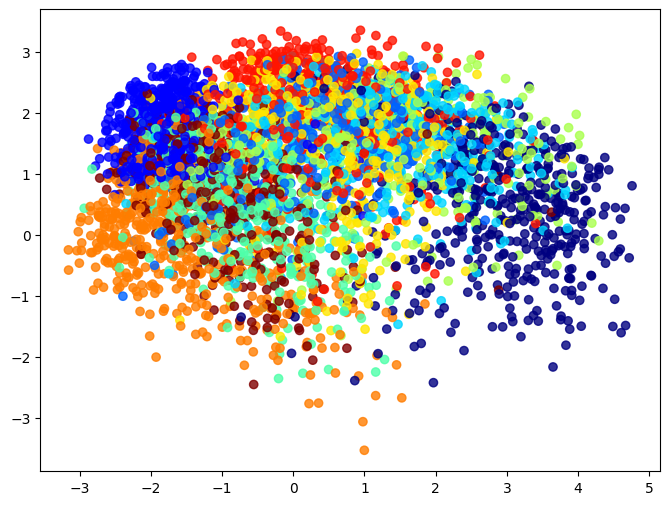

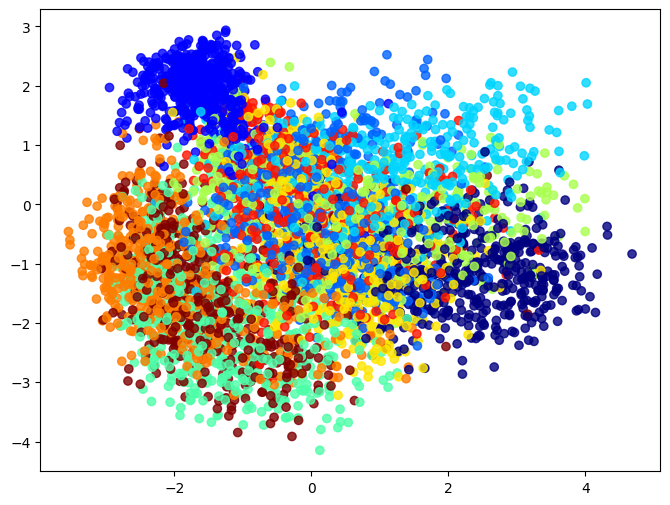

...

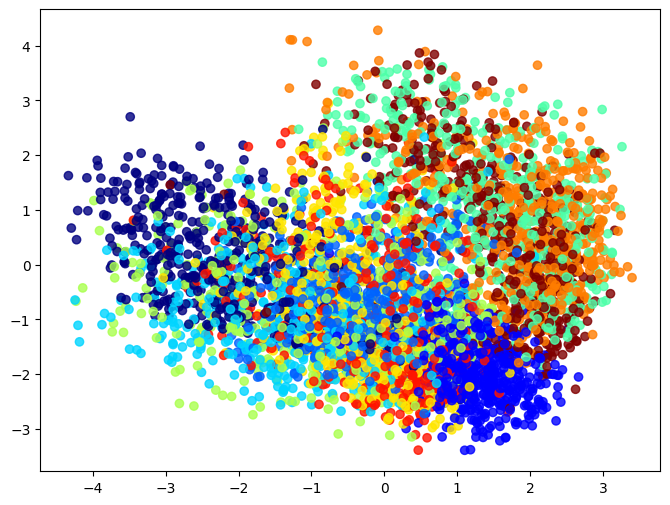

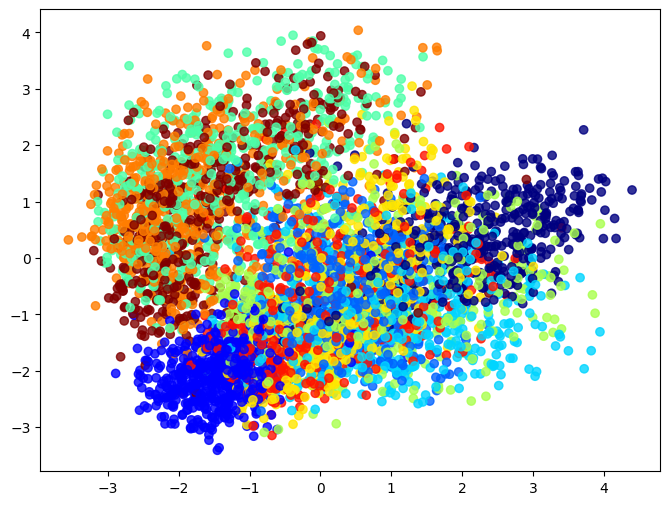

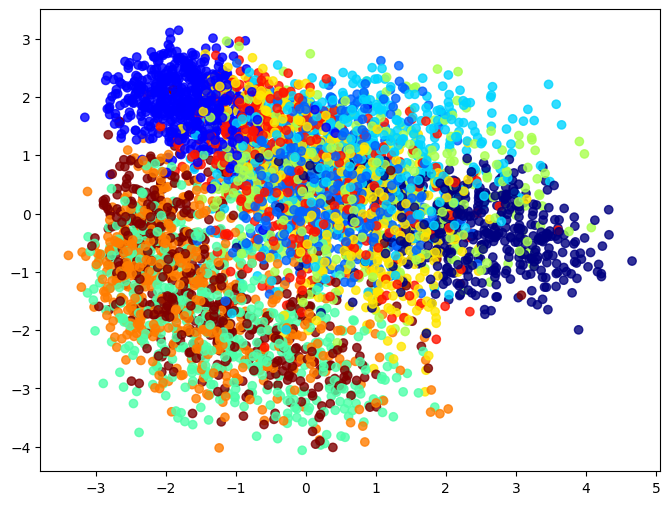

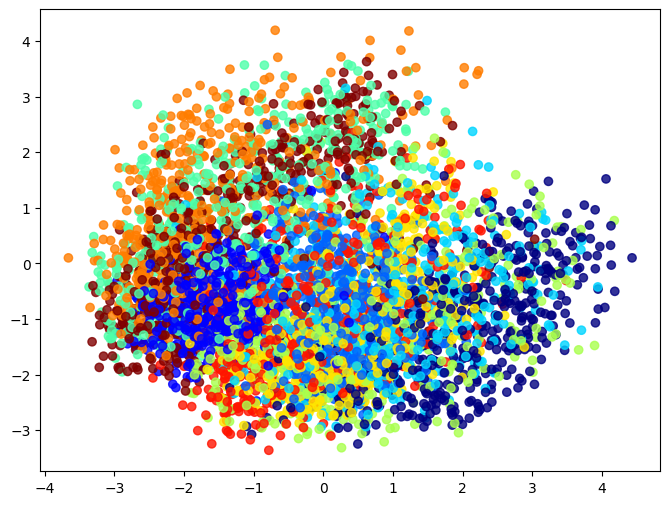

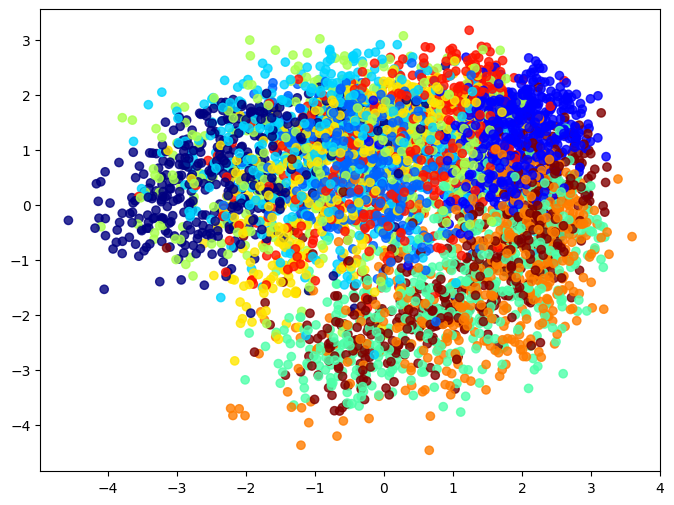

In [118]:
from torch.optim import Adam
import torch.nn.functional as F
# import wandb

TRAIN_STEPS = 10_001
BATCH_SIZE = 64
# BETA = 0.3
BETA = 0.1
LR = 3e-4

vae = VAE(10, 128).to("cuda")
optim = Adam(vae.parameters(), lr=LR)
images = images.to("cuda")

# run = wandb.init(
#     entity="gbc24001-university-of-connecticut",
#     project="vae",
#     config={"lr": LR, "beta": BETA, "batch size": BATCH_SIZE}
# )

for step in range(TRAIN_STEPS):
    xb = images[torch.randint(len(images), (BATCH_SIZE,))]

    x_recon, means, log_vars, stds = vae(xb)

    recon_loss = 0.5 * ((xb - x_recon) ** 2.0).sum(dim=(1, 2, 3)).mean()

    kl = 0.5 * ((means ** 2) + (stds ** 2) - log_vars - 1).sum(dim=1).mean()
    loss = recon_loss + BETA * kl

    optim.zero_grad(set_to_none=True)
    loss.backward()
    optim.step()

    if step % 100 == 0:
        # run.log({"loss": loss, "recon_loss": recon_loss, "kl": kl}, step=step)

        # recon_images = torch.stack((xb[:10].detach().to("cpu"), x_recon[:10].detach().to("cpu")))
        # recon_images = rearrange(recon_images, "n b c h w -> c (n h) (b w)")
        # recon_images = ((recon_images.clip(-1, 1) + 1) * (255 / 2)).to(dtype=torch.uint8)
        # run.log({"recons": wandb.Image(recon_images)}, step=step)
        pass

    if step % 1_000 == 0:
        print(f"{step:6d}: loss={loss:.4f}   recon_loss={recon_loss:.4f}   kl={kl:.4f}")

        with torch.no_grad():
            _, zs, _, _ = vae(images[:5000])
            u, s, vh = torch.linalg.svd(zs, full_matrices=False)
            zs_2d = (u[:, :2] * s[:2]).cpu()
        plt.figure(figsize=(8, 6))
        plt.scatter(zs_2d[:, 0], zs_2d[:, 1], c=labels[:5000], alpha=0.8, cmap=plt.get_cmap("jet", 10))
        # run.log({"latent2d": plt}, step=step)

# run.finish()

In [119]:
torch.save(vae.state_dict(), "VAE_PRE_ADVERSARIAL.pth")

In [120]:
class PatchDiscriminator(nn.Module):

    def __init__(self, input_channels=1):
        super().__init__()
        # try leakyReLU 0.2
        self.net = nn.Sequential(
            # (B, 1, 28, 28)
            nn.Conv2d(input_channels, 64, kernel_size=4, stride=2, padding=1),
            # (B, 64, 14, 14)
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            # (B, 128, 7, 7)
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            # (B, 256, 7, 7)
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            # patch
            nn.Conv2d(256, 1, kernel_size=3, stride=1, padding=1)
            # (B, 1, 7, 7)
        )

    def forward(self, x):
        return self.net(x)

vae = VAE(10, 128).to("cuda")

discriminator = PatchDiscriminator().to("cuda")

opt_vae = Adam(vae.parameters(), lr=LR)
opt_disc = Adam(discriminator.parameters(), lr=LR)

adversarial_loss = nn.MSELoss()

ADV_WEIGHT = 0.5

     0: loss=368.0715  loss_d=0.4514  recon=367.8963  kl=0.1272  adv=0.3249
  1000: loss=55.9546  loss_d=0.0009  recon=52.6800  kl=27.6963  adv=1.0099
  2000: loss=50.3166  loss_d=0.0008  recon=47.0897  kl=27.3058  adv=0.9925
  3000: loss=45.1698  loss_d=0.0004  recon=41.9451  kl=27.1033  adv=1.0287
  4000: loss=43.5489  loss_d=0.0010  recon=40.3312  kl=27.0485  adv=1.0256
  5000: loss=37.6256  loss_d=0.0002  recon=34.4353  kl=26.9068  adv=0.9993
  6000: loss=40.7396  loss_d=0.0007  recon=37.6464  kl=25.8311  adv=1.0203
  7000: loss=41.2359  loss_d=0.0003  recon=38.0927  kl=26.3882  adv=1.0088
  8000: loss=37.1430  loss_d=0.0001  recon=33.9769  kl=26.6231  adv=1.0077
  9000: loss=37.8628  loss_d=0.0002  recon=34.6639  kl=26.9683  adv=1.0043
 10000: loss=40.8888  loss_d=0.0003  recon=37.6427  kl=27.3160  adv=1.0291


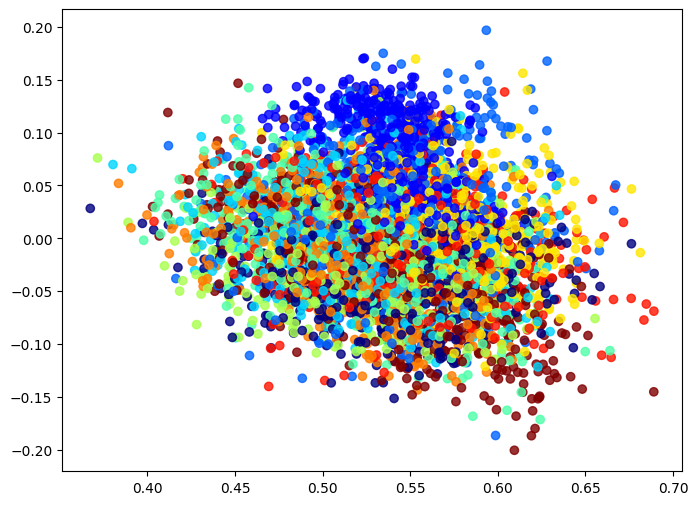

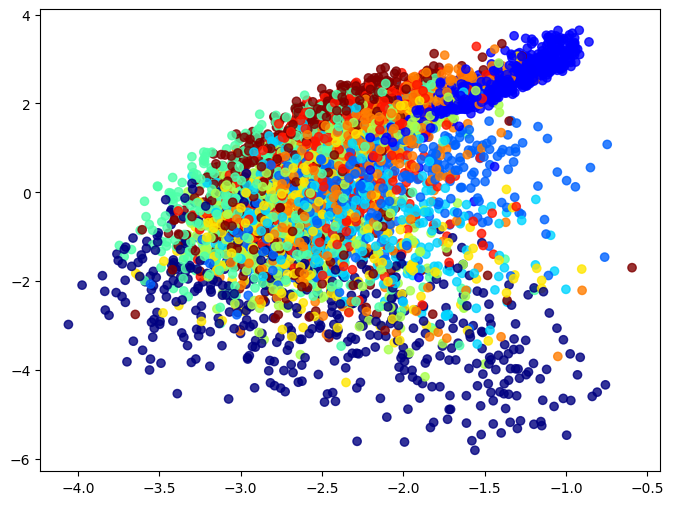

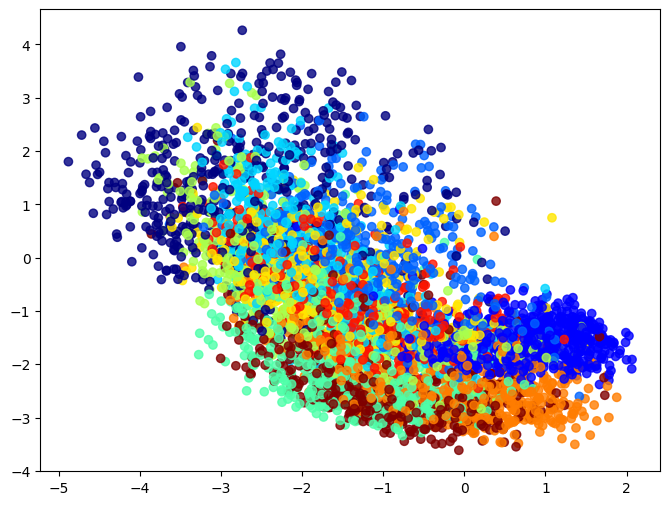

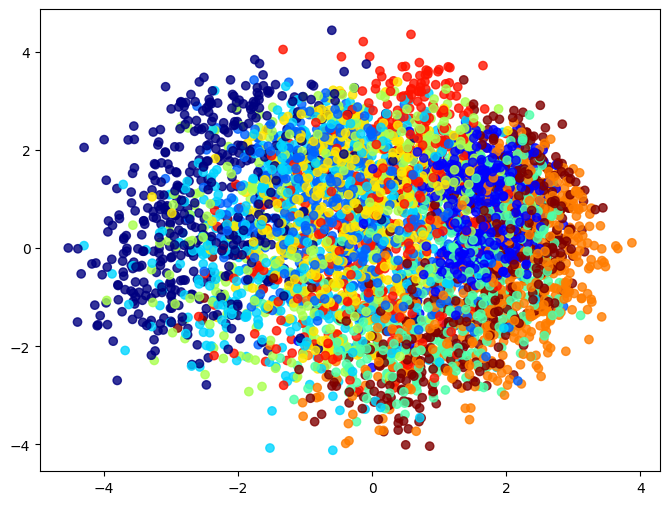

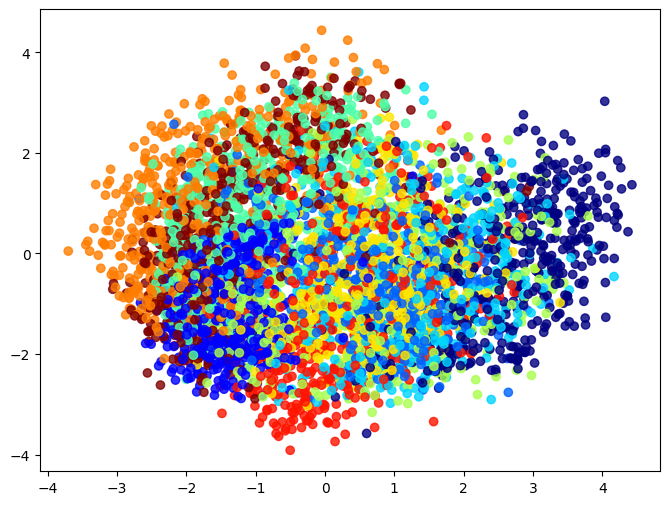

...

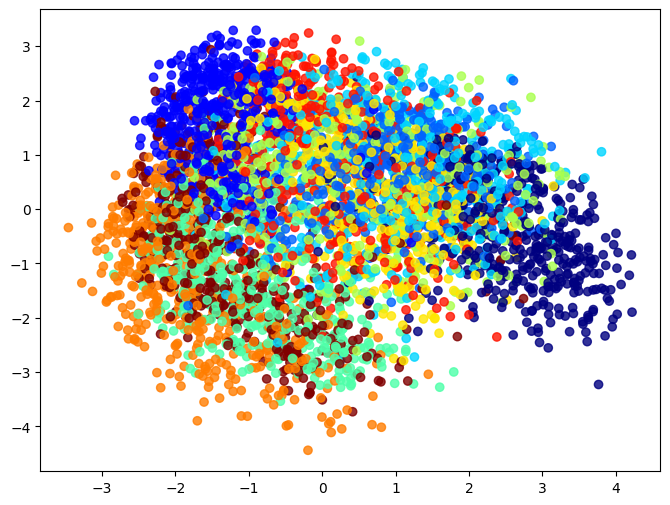

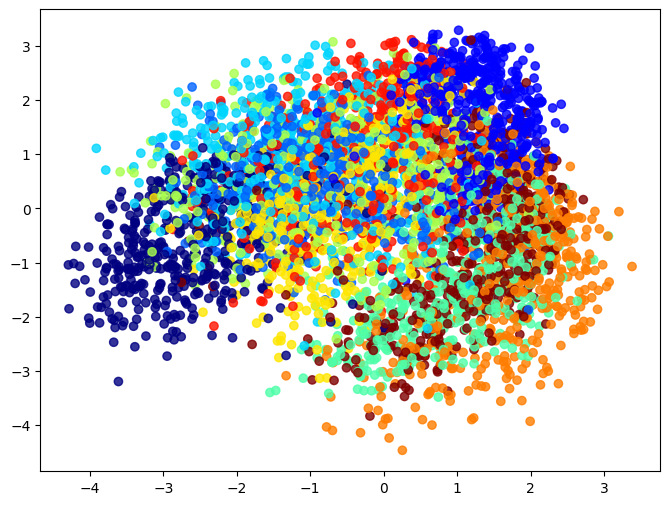

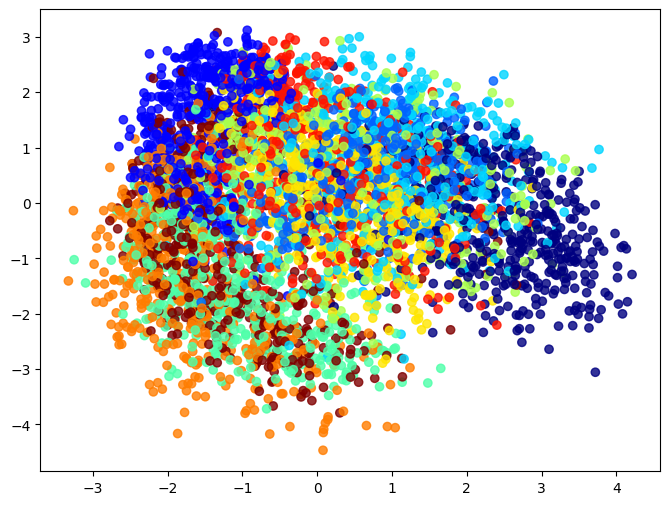

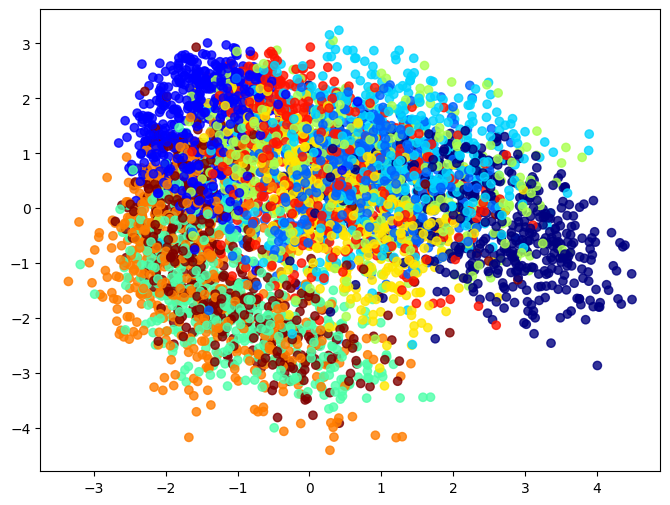

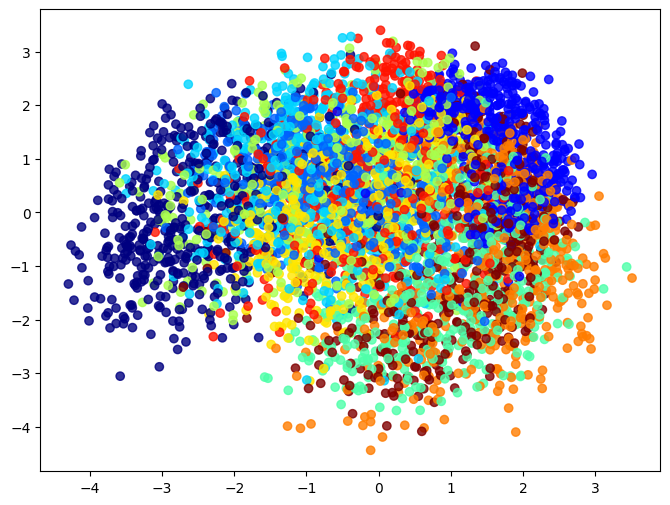

In [121]:
for step in range(TRAIN_STEPS):
    # real
    real_imgs = images[torch.randint(len(images), (BATCH_SIZE,))]

    # fake
    fake_imgs, means, log_vars, stds = vae(real_imgs)

    opt_disc.zero_grad(set_to_none=True)

    logits_real = discriminator(real_imgs)
    logits_fake = discriminator(fake_imgs.detach())

    # loss
    # wants real to be 1
    loss_d_real = adversarial_loss(logits_real, torch.ones_like(logits_real))
    # wants fake to be 0
    loss_d_fake = adversarial_loss(logits_fake, torch.zeros_like(logits_fake))

    loss_d = (loss_d_real + loss_d_fake) * 0.5

    loss_d.backward()
    opt_disc.step()

    opt_vae.zero_grad(set_to_none=True)

    recon_loss = 0.5 * ((real_imgs - fake_imgs) ** 2.0).sum(dim=(1, 2, 3)).mean()

    kl_loss = 0.5 * ((means ** 2) + (stds ** 2) - log_vars - 1).sum(dim=1).mean()

    # adversarial loss
    logits_fake_for_vae = discriminator(fake_imgs)
    adv_loss = adversarial_loss(logits_fake_for_vae, torch.ones_like(logits_fake_for_vae))

    # total loss
    loss_vae = recon_loss + (BETA * kl_loss) + (ADV_WEIGHT * adv_loss)

    loss_vae.backward()
    opt_vae.step()

    # uncomment if you want to use wandb to log
    if step % 100 == 0:
        # run.log({
        #     "loss_vae": loss_vae,
        #     "recon_loss": recon_loss,
        #     "kl_loss": kl_loss,
        #     "adv_loss": adv_loss,  # Log new adversarial loss
        #     "loss_d": loss_d       # Log new discriminator loss
        # }, step=step)

        recon_images = torch.stack((real_imgs[:10].detach().cpu(), fake_imgs[:10].detach().cpu()))
        recon_images = rearrange(recon_images, "n b c h w -> c (n h) (b w)")
        recon_images = ((recon_images.clip(-1, 1) + 1) * (255 / 2)).to(dtype=torch.uint8)
        # run.log({"recons": wandb.Image(recon_images)}, step=step)

    if step % 1000 == 0:
        print(f"{step:6d}: loss={loss_vae:.4f}  loss_d={loss_d:.4f}  recon={recon_loss:.4f}  kl={kl_loss:.4f}  adv={adv_loss:.4f}")

        with torch.no_grad():
            _, zs, _, _ = vae(images[:5000])
            u, s, vh = torch.linalg.svd(zs, full_matrices=False)
            zs_2d = (u[:, :2] * s[:2]).cpu()
        plt.figure(figsize=(8, 6))
        plt.scatter(zs_2d[:, 0], zs_2d[:, 1], c=labels[:5000], alpha=0.8, cmap=plt.get_cmap("jet", 10))
        # run.log({"latent2d": plt}, step=step)

# run.finish()

In [122]:
torch.save(vae.state_dict(), "VAE_ADVERSARIAL.pth")

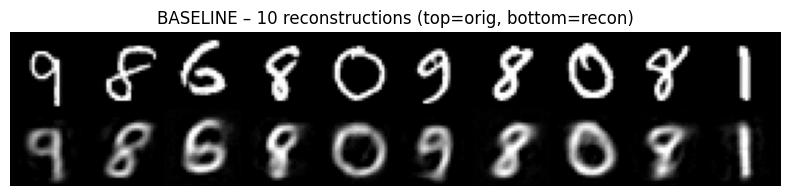

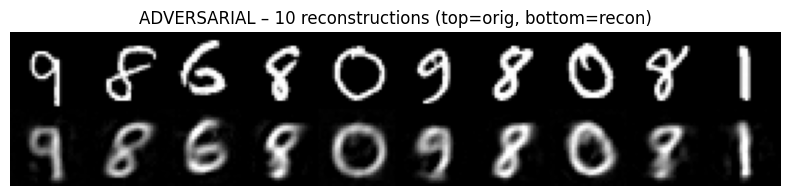

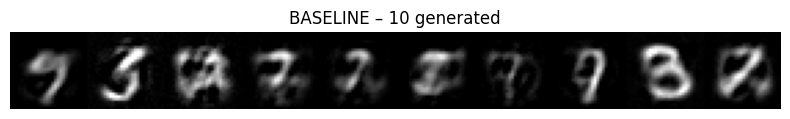

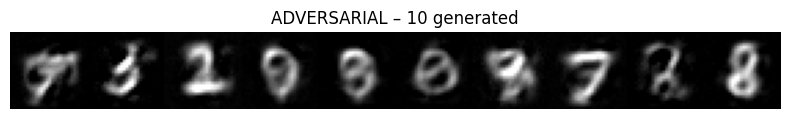

In [126]:
vae_no_adv = VAE(10, 128).to("cuda")
vae_no_adv.load_state_dict(torch.load("VAE_PRE_ADVERSARIAL.pth"))
vae_no_adv.eval()

vae_adv = VAE(10, 128).to("cuda")
vae_adv.load_state_dict(torch.load("VAE_ADVERSARIAL.pth"))
vae_adv.eval()

def show_samples(title, imgs):
    imgs = imgs.cpu().clip(-1, 1)

    grid = rearrange(imgs, "b c h w -> c h (b w)")
    grid = (grid + 1) / 2
    plt.figure(figsize=(10, 1))
    plt.title(title)
    plt.imshow(grid.squeeze(), cmap="gray")
    plt.axis("off")
    plt.show()

def show_reconstructions(title, originals, recons):
    originals = originals.cpu().clip(-1, 1)
    recons = recons.cpu().clip(-1, 1)

    comp = torch.cat([originals, recons], dim=0)
    grid = rearrange(comp, "(n b) c h w -> c (n h) (b w)", n=2)
    grid = (grid + 1) / 2
    plt.figure(figsize=(10, 2))
    plt.title(title)
    plt.imshow(grid.squeeze(), cmap="gray")
    plt.axis("off")
    plt.show()

eval_imgs = images[torch.randint(len(images), (10,))]

with torch.no_grad():
    recon_no_adv, _, _, _ = vae_no_adv(eval_imgs)
    recon_adv, _, _, _ = vae_adv(eval_imgs)

show_reconstructions(
    "BASELINE – 10 reconstructions (top=orig, bottom=recon)",
    eval_imgs, recon_no_adv
)

show_reconstructions(
    "ADVERSARIAL – 10 reconstructions (top=orig, bottom=recon)",
    eval_imgs, recon_adv
)

LATENT_DIM = 10

with torch.no_grad():
    z = torch.randn(10, LATENT_DIM).to("cuda")

    # baseline
    samples_no_adv = vae_no_adv.dec(z)
    samples_no_adv = rearrange(samples_no_adv, "b (c h w) -> b c h w", c=1, h=28, w=28)
    samples_no_adv = samples_no_adv.clip(-1, 1)

    # adversarial
    samples_adv = vae_adv.dec(z)
    samples_adv = rearrange(samples_adv, "b (c h w) -> b c h w", c=1, h=28, w=28)
    samples_adv = samples_adv.clip(-1, 1)

show_samples("BASELINE – 10 generated", samples_no_adv)
show_samples("ADVERSARIAL – 10 generated", samples_adv)